In [ ]:
from google.colab import files

%mkdir data
%mkdir data/nsOCT
%rm -rf sample_data/

!7z x /content/drive/MyDrive/RightRing.7z

In [ ]:
%tensorflow_version 2.x
import tensorflow

device_name = tensorflow.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

In [ ]:
""" Project Information """
__author__ = "Aaron Flanagan"
__copyright__ = "NUIG"
__credits__ = "Aaron Flanagan"
__version__ = "1.0.0"
__email__ = "A.flanagan18@nuigalway.com"
__status__ = "Development"

from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD

In [ ]:
class UNet:

    def __init__(self, img_size, n_class=2, filter_size=64):
        self.img_size = img_size
        self.n_class = n_class
        self.filter_size = filter_size
        self.model = self.build()

    def build(self):
        # Down-sampling phase
        inputs = keras.Input(shape=self.img_size)

        # 4 contract blocks that have skip connections
        x, skip1 = self.contract_block(inputs, self.filter_size)  # 64
        x, skip2 = self.contract_block(x, self.filter_size * 2)  # 128
        x, skip3 = self.contract_block(x, self.filter_size * 4)  # 216
        x, skip4 = self.contract_block(x, self.filter_size * 8)  # 512

        # final contract block, no skips
        x = self.contract_block(x, self.filter_size * 16, include_pool=False)

        # up-sampling phase
        self.filter_size = self.filter_size * 8  # 512
        x = self.expanse_block(x, skip4, self.filter_size)
        x = self.expanse_block(x, skip3, self.filter_size // 2)
        x = self.expanse_block(x, skip2, self.filter_size // 4)
        x = self.expanse_block(x, skip1, self.filter_size // 8)

        outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name="U-Net")
        print("Model is built...")

        return model

    def contract_block(self, inputs, f, include_pool=True):
        x = layers.Conv2D(f, kernel_size=3, kernel_initializer="he_normal", padding='same', activation='relu')(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(f, kernel_size=3, kernel_initializer="he_normal", padding='same', activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(rate=0.2)(x)

        if include_pool:
            p = layers.MaxPool2D(pool_size=(2, 2))(x)
            return p, x

        return x

    def expanse_block(self, inputs, skip, f):
        x = layers.Conv2DTranspose(f, kernel_size=(2, 2), strides=2, padding='same')(inputs)

        # handle odd dimensions
        if skip.shape[2] % 2 != 0:
            x = layers.ZeroPadding2D(padding=((0, 0), (0, 1)))(x)  # pad right
        elif skip.shape[1] % 2 != 0:
            x = layers.ZeroPadding2D(padding=((0, 1), (0, 0)))(x)  # pad bottom

        # skip connection
        x = layers.Concatenate()([x, skip])  # default axis -1 (depth)
        x = self.contract_block(x, f, include_pool=False)

        return x

    def compile(self, optimizer="sgd", loss='binary_crossentropy'):
        self.model.compile(optimizer=optimizer, loss=loss, metrics=['binary_accuracy', 'AUC'])

    def fit(self, X, y, validation_split=0.2, epochs=1, batch_size=None):
        log_dir = "logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
        tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
        early_stopping_callback = keras.callbacks.EarlyStopping(monitor='loss', patience=3)

        return self.model.fit(x=X, y=y, epochs=epochs,
                              validation_split=validation_split,
                              callbacks=[tensorboard_callback, early_stopping_callback],
                              batch_size=batch_size,
                              shuffle=True,
                              validation_batch_size=batch_size)

    def summary(self):
        return self.model.summary()

    def predict(self, X, batch_size=None):
        return self.model.predict(X, batch_size=batch_size)

    def plot(self):
        return keras.utils.plot_model(self.model,
                                      "trained_model_" + datetime.now().strftime("%Y%m%d-%H%M%S") + ".png",
                                      show_shapes=True)

    def save(self, model_history):
        filename = datetime.now().strftime("%Y%m%d-%H%M%S") + ".h5"
        self.model.save(filename)
        self.model.save_weights("model_weights_" + filename)
        np.save(filename + '_history.npy', model_history.history)

        return filename

    def evaluate(self, X, y, batch_size=None):
        return self.model.evaluate(X, y, batch_size=batch_size)

    def load(filename):
        return keras.models.load_model("models/" + filename)

    def load_weights(self, model, filename):
        return model.load_weights("models/weights/model_weights_" + filename)


In [ ]:
"""
Main script used to load the data and build the model
"""

def load_data(data_type, num_training_samples, num_test_samples, filename="RightRing"):
    path = "data/"
    all_samples = num_training_samples + num_test_samples

    # LOAD nsOCT DATA
    if data_type == "ns":
        X = np.load(path + 'nsOCT/' + filename + '.npy')

        # MIN-MAX NORMALISE DATA 0-1
        X = (X - np.min(X)) / (np.max(X) - np.min(X))

    # OCT DATA
    if data_type == "oct":
        # matplotlib normalises the data on import 0-255 > 0.0-1.0
        X = np.array([plt.imread("/content/drive/MyDrive/OCT/" + str(i) + ".png") for i in range(0, all_samples)])

    # add channel dimension
    X = X[..., np.newaxis]

    # LOAD TRAINING DATA
    X_train = X[:num_training_samples + 1, ...]
    X_test = X[num_training_samples + 1:all_samples, ...]
    
    # LOAD LABELS
    y = np.array([plt.imread("/content/drive/MyDrive/labels/" + str(i) + ".png") for i in range(0, all_samples)])
    y_train = y[:num_training_samples + 1, ..., np.newaxis]
    y_test = y[num_training_samples + 1:all_samples, ..., np.newaxis]

    return X_train, y_train, X_test, y_test


X_train, y_train, X_test, y_test = load_data("ns", num_training_samples=300, num_test_samples=50)

In [ ]:
#Hyperparameter tunining

# the accuracy must be above 97% for the layers to be segmenteds
best_accuracy = 0.98
#for learning_rate in [0.01, 0.02, 0.05, 0.1, 0.2]:
  #for beta in [0.8, 0.85, 0.9, 0.99]:

for epoch in [20]:
  # BUILD MODEL
  model = UNet(X_train.shape[1:])
  model.compile(optimizer=Adam(learning_rate=0.01))

  # RUN & SAVE MODEL
  model_history = model.fit(X_train, y_train, epochs=epoch, batch_size=1)
  current_accuracy = model_history.history["binary_accuracy"][-1]
  print(current_accuracy)

  if current_accuracy > best_accuracy:
    best_accuracy = current_accuracy
    filename = model.save(model_history)

    # EVALUATE TEST DATA
    test_eval = model.evaluate(X_test, y_test, batch_size=1)

In [ ]:
pred = model.predict(X_test, batch_size=1)

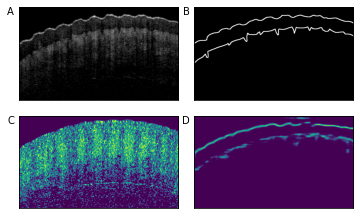

In [49]:
fig, axes = plt.subplots(2, 2)

oct_image = plt.imread("/content/drive/MyDrive/OCT/300.png")
oct_mask = plt.imread("/content/drive/MyDrive/labels/300.png")

axes[0, 0].imshow(oct_image, cmap="gray")
axes[0, 1].imshow(oct_mask, cmap="gray")

axes[1, 0].imshow(X_test[0,..., 0], cmap="viridis")
axes[1, 1].imshow(pred[0,..., 0], cmap="viridis")

axes[0, 0].set_ylabel("A", rotation=0)
axes[0, 1].set_ylabel("B", rotation=0)

axes[1,0].set_ylabel("C", rotation=0)
axes[1,1].set_ylabel("D", rotation=0)

axes[0, 0].yaxis.set_label_coords(-0.05, 0.9)
axes[0, 1].yaxis.set_label_coords(-0.05, 0.9)
axes[1,0].yaxis.set_label_coords(-0.05, 0.9)
axes[1,1].yaxis.set_label_coords(-0.05, 0.9)

plt.subplots_adjust(wspace=0.1, hspace=0)
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);

In [50]:
model_history = np.load("/content/20210826-095159.h5_history.npy", allow_pickle=True)
model_history = model_history[()]
auc = model_history["auc"]
binary_accuracy = model_history["binary_accuracy"]
loss = model_history["loss"]
val_auc = model_history["val_auc"]
val_binary_accuracy = model_history["val_binary_accuracy"]
val_loss = model_history["val_loss"]

In [53]:
print(model_history["binary_accuracy"])
print(model_history["val_binary_accuracy"])

[0.9654265642166138, 0.9782050848007202, 0.9782180190086365, 0.9782147407531738, 0.9782371520996094, 0.9783583879470825, 0.9783488512039185, 0.9785718321800232, 0.978780210018158, 0.9789087176322937, 0.9787766933441162, 0.9791786074638367, 0.9794846177101135, 0.9797331094741821, 0.9800567626953125]
[0.9778984785079956, 0.9778984785079956, 0.9778984785079956, 0.9778984785079956, 0.9776816368103027, 0.9778867363929749, 0.9761128425598145, 0.9771918654441833, 0.9761598706245422, 0.9735288023948669, 0.9743731021881104, 0.975658655166626, 0.974907636642456, 0.9714464545249939, 0.9759223461151123]


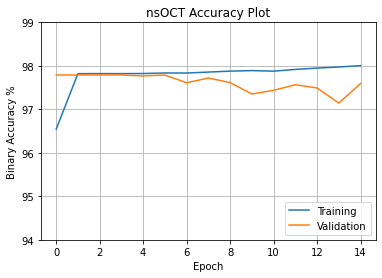

In [54]:
epochs = np.arange(0, len(binary_accuracy), 1)

plt.plot(epochs, np.asarray(binary_accuracy)*100)
plt.plot(epochs, np.asarray(val_binary_accuracy)*100)

plt.xlabel("Epoch")
plt.ylabel("Binary Accuracy %")
plt.grid()
plt.ylim(94, 99)
plt.title("nsOCT Accuracy Plot")

plt.legend(["Training", "Validation"], loc='lower right')


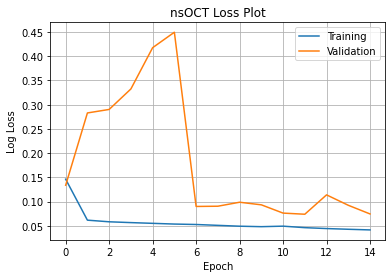

In [55]:
epochs = np.arange(0, len(loss), 1)

plt.plot(epochs, loss)
plt.plot(epochs, val_loss)

plt.xlabel("Epoch")
plt.ylabel("Log Loss")
plt.grid()
plt.title("nsOCT Loss Plot")


plt.legend(["Training", "Validation"], loc='upper right')


In [32]:
unseen_samples, y_train, X_test, y_test = load_data("ns", num_training_samples=999, num_test_samples=0)
unseen_samples = unseen_samples[600:-1,...]
del y_train, X_test, y_test;

In [33]:
predictions = model.predict(unseen_samples, batch_size=1)

In [ ]:
from matplotlib import animation
plt.rc('animation', html='jshtml')

# for storing and displaying the animated images
frames = []
fig = plt.figure()

plt.tick_params(labelsize=10)
plt.xlabel('Lateral extent (mm)', fontsize=12)
plt.ylabel('Depth (mm)', fontsize=12)
plt.set_cmap("viridis")

# add images as frames to the plot
for img in range(len(predictions)):
    frames.append([plt.imshow(predictions[img, ..., 0], animated=True)])


cbar = plt.colorbar()
cbar.set_label('Class Probability', fontsize=11)

anim = animation.ArtistAnimation(fig, frames, interval=40, blit=True, repeat=False)

In [37]:
anim